In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/140k-real-and-fake-faces/valid.csv
/kaggle/input/140k-real-and-fake-faces/train.csv
/kaggle/input/140k-real-and-fake-faces/test.csv
/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/fake/W3DVWMWYOI.jpg
/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/fake/IQEOWSOAID.jpg
/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/fake/8JL4TYOH6D.jpg
/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/fake/69FFH5KFY8.jpg
/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/fake/ZZAA0631IK.jpg
/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/fake/BDY8YAWSIS.jpg
/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/fake/XKHWRIM64I.jpg
/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/fake/S579BG249Z.jpg
/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid/fake/BLIFEE55NI.jpg
/kaggle/input/140k-real-and-fake-fa

In [3]:
import os
import pandas as pd
import PIL
from matplotlib import image
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from keras.applications.densenet import DenseNet169
from tensorflow import keras
import tensorflow as tf

ModuleNotFoundError: No module named 'tqdm'

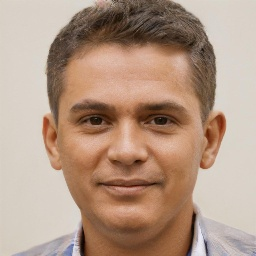

In [19]:
# checking if we have access to image
PIL.Image.open("/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/train/fake/H7PRNYG8IN.jpg")

In [20]:
import pathlib
# loading all image in the train, test, validate folder
IMAGE_PATH = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake"
win_path = pathlib.Path(IMAGE_PATH)
win_path

PosixPath('/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake')

# loading dataset

In [21]:
# training dataset
train_real = list(win_path.glob('train/real/*.jpg'))
train_fake = list(win_path.glob('train/fake/*.jpg'))
print('Training Real Image Sample : {}'.format(len(train_real)))
print('Training Fake Image Sample : {}'.format(len(train_fake)))

Training Real Image Sample : 50000
Training Fake Image Sample : 50000


In [22]:
# test dataset
test_real = list(win_path.glob('test/real/*.jpg'))
test_fake = list(win_path.glob('test/fake/*.jpg'))
print('Test Real Image Sample : {}'.format(len(train_real)))
print('Test Fake Image Sample : {}'.format(len(train_fake)))

Test Real Image Sample : 50000
Test Fake Image Sample : 50000


In [23]:
# validation dataset
validation_real = list(win_path.glob('valid/real/*.jpg'))
validation_fake = list(win_path.glob('valid/fake/*.jpg'))
print('Validation Fake Image Sample : {}'.format(len(validation_real)))
print('Validation Fake Image Sample : {}'.format(len(validation_fake)))

Validation Fake Image Sample : 10000
Validation Fake Image Sample : 10000


# Data Exploration

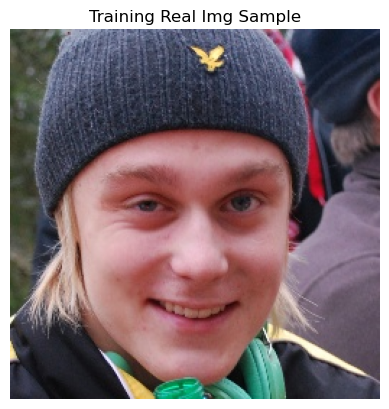

In [24]:
img = image.imread(train_real[0])
plt.title('Training Real Img Sample')
plt.axis('off')
plt.imshow(img)
plt.show()

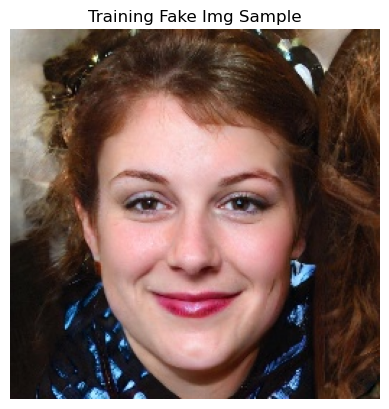

In [25]:
img = image.imread(train_fake[100])
plt.title('Training Fake Img Sample')
plt.axis('off')
plt.imshow(img)
plt.show()

In [ ]:
# exploring show image size
sample_images = []
for id in range(10):
    img = image.imread(train_real[id])
    sample_images.append(img)
    
sample_images[0]

In [30]:
# eploring image size
for img in sample_images: 
    print(img.shape)

(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


# Loading Actual Image in Numpy

In [31]:
# laoding actual image.. 
# LOADING IMAGE FROM DIR
train_img_diction={
    'real': train_real, 
    'fake': train_fake
}

train_img_diction.keys()

# using the diction to load label
train_lbl_diction = {
     'fake':0, 
     'real':1
 }
    
train_lbl_diction.keys()

dict_keys(['fake', 'real'])

In [ ]:
# loading training X and label y numpy array in a list.... 
# X = []
# y = []

# for key, image in tqdm(train_img_diction.items()): 
#     for img in image:
#         img = cv2.imread(str(img))
# #       resizing the image
#         reshape_image = cv2.resize(img, (196,196))
#         X.append(reshape_image)
#         y.append(train_lbl_diction[key])

In [32]:
# loading training X and label y in IMage Generator.... 
# defining image generator
TRAIN_PATH = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/train"
training_img_generator = ImageDataGenerator(rescale=1./255, horizontal_flip=True, vertical_flip=True)
# loading from directory
# target_size=(96,96)
train_img_data = training_img_generator.flow_from_directory(directory=TRAIN_PATH, target_size=(128,128),  class_mode='binary', color_mode='rgb', shuffle=True)

Found 100000 images belonging to 2 classes.


In [35]:
# loading validation data X and label y usng Image Generaotor Model.... 
# defining image generator
VALID_PATH = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/valid"
valid_img_generator = ImageDataGenerator(rescale=1./255, horizontal_flip=True, vertical_flip=True)
# loading from directory
valid_img_data = training_img_generator.flow_from_directory(directory=VALID_PATH, target_size=(128,128), class_mode='binary', color_mode='rgb', shuffle=True)

Found 20000 images belonging to 2 classes.


In [49]:
# loading validation data X and label y usng Image Generaotor Model.... 
# defining image generator
TEST_PATH = "/kaggle/input/140k-real-and-fake-faces/real_vs_fake/real-vs-fake/test"
test_img_generator = ImageDataGenerator(rescale=1./255)
# loading from directory
test_img_data = test_img_generator.flow_from_directory(directory=VALID_PATH, target_size=(128,128), class_mode='binary', color_mode='rgb')

Found 20000 images belonging to 2 classes.


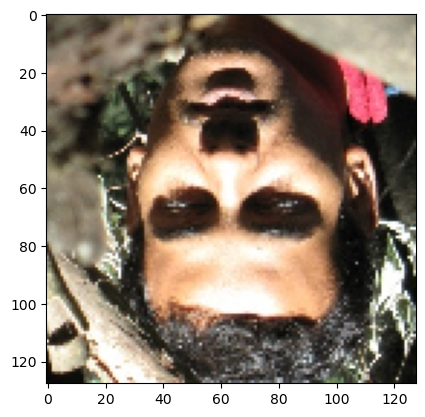

In [36]:
plt.imshow(valid_img_data.next()[0][0])
plt.show()

In [ ]:
# train img eploration 
train_img_data.class_indices

In [ ]:
train_img_data.image_shape

In [ ]:
img = train_img_data.next()[0][3]
plt.imshow(img)

In [37]:
vgg_weight = VGG16(weights = 'imagenet', include_top = False) 
vgg_weight.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [44]:
# keping weight constrant accross all 
# vgg16 layer model
for layer in vgg_weight.layers:
    layer.trainable = False

In [47]:

SHAPE = (128, 128,3)

# input layer
input_layer = keras.layers.Input(shape=SHAPE)

# vgg19 model layers 
vgg_output = vgg_weight(input_layer)

# dense layer
output = keras.layers.GlobalMaxPooling2D()(vgg_output)
output1 = keras.layers.Dense(128, activation='relu')(output)
final_output = keras.layers.Dense(1, activation='sigmoid')(output1)

# build the model
spoofing_model = keras.models.Model(inputs=[input_layer], outputs=[final_output])

# compile model
# COMPILATION PARAMETER
spoofing_model.compile(
    optimizer='Adam', 
    loss='binary_crossentropy', 
    metrics=['accuracy']
)

# summary of the functional custome dataset
spoofing_model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, None, None, 512)   14714688  
                                                                 
 global_max_pooling2d_4 (Glo  (None, 512)              0         
 balMaxPooling2D)                                                
                                                                 
 dense_8 (Dense)             (None, 128)               65664     
                                                                 
 dense_9 (Dense)             (None, 1)                 129       
                                                                 
Total params: 14,780,481
Trainable params: 65,793
Non-trainable params: 14,714,688
__________________________________________

In [48]:
logdir = '/kaggle/working/logs'
call_back = tf.keras.callbacks.TensorBoard(log_dir=logdir)
spoofing_training_history = spoofing_model.fit_generator(train_img_data, validation_data=valid_img_data, epochs=8, callbacks=call_back)

Epoch 1/8


/tmp/ipykernel_150/3150853675.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  spoofing_training_history = spoofing_model.fit_generator(train_img_data, validation_data=valid_img_data, epochs=8, callbacks=call_back)


3125/3125 [==============================] - 314s 99ms/step - loss: 0.6011 - accuracy: 0.6757 - val_loss: 0.5885 - val_accuracy: 0.6894
Epoch 2/8
3125/3125 [==============================] - 267s 85ms/step - loss: 0.5662 - accuracy: 0.7061 - val_loss: 0.5505 - val_accuracy: 0.7247
Epoch 3/8
3125/3125 [==============================] - 263s 84ms/step - loss: 0.5477 - accuracy: 0.7210 - val_loss: 0.5439 - val_accuracy: 0.7252
Epoch 4/8
3125/3125 [==============================] - 261s 84ms/step - loss: 0.5360 - accuracy: 0.7307 - val_loss: 0.5331 - val_accuracy: 0.7350
Epoch 5/8
3125/3125 [==============================] - 255s 82ms/step - loss: 0.5284 - accuracy: 0.7357 - val_loss: 0.5230 - val_accuracy: 0.7412
Epoch 6/8
3125/3125 [==============================] - 258s 82ms/step - loss: 0.5202 - accuracy: 0.7423 - val_loss: 0.5192 - val_accuracy: 0.7413
Epoch 7/8
3125/3125 [==============================] - 260s 83ms/step - loss: 0.5143 - accuracy: 0.7448 - val_loss: 0.5201 - val_accur

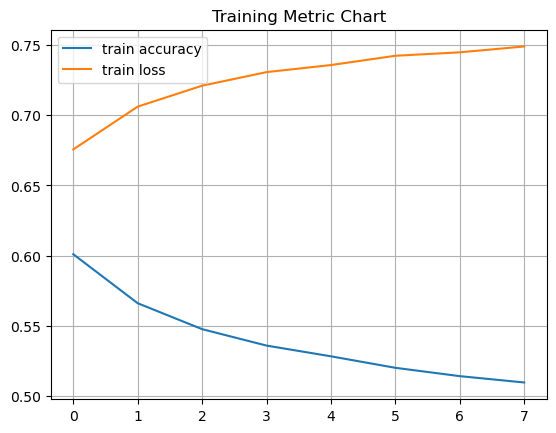

In [58]:
t_loss = spoofing_training_history.history['loss']
t_acc = spoofing_training_history.history['accuracy']
v_loss= spoofing_training_history.history['val_loss']
v_acc = spoofing_training_history.history['val_accuracy']


plt.title('Training Metric Chart')
plt.plot(t_loss, label='train accuracy')
plt.plot(t_acc, label='train loss')
plt.grid()
plt.legend()
plt.show()

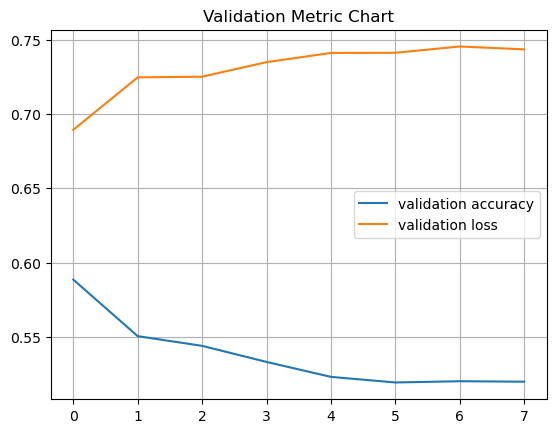

In [59]:

plt.title('Validation Metric Chart')
plt.plot(v_loss, label='validation accuracy')
plt.plot(v_acc, label='validation loss')
plt.grid()
plt.legend()
plt.show()

In [51]:
face_detect_evaluation = spoofing_model.evaluate_generator(test_img_data)
face_detect_evaluation

/tmp/ipykernel_150/2210792970.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  face_detect_evaluation = spoofing_model.evaluate_generator(test_img_data)


[0.5077447295188904, 0.7531999945640564]

In [52]:
# show evaluation result 
print('Spoofing Image Loss    : ', face_detect_evaluation[0])
print('Spoofing Image Accracy : ', face_detect_evaluation[1])

Spoofing Image Loss    :  0.5077447295188904
Spoofing Image Accracy :  0.7531999945640564


In [ ]:
# save Model 
spoofing_model.save('/kaggle/input/spoofing_model.h5')
print('file uploaded')

In [ ]:

# dense network
# densnet_model = DenseNet169(weights='imagenet', include_top=False)
# print('Numbers of Densnet Layer: ' , len(densnet_model.layers))

#### SECTION TWO (Face Detection From Scratch)

In [4]:
# importing essential model
import os 
import time 
import uuid 
import cv2
import tensorflow as tf 
import json 
import numpy as np 
from matplotlib import pyplot as plt
from matplotlib import image

In [5]:
os.listdir()

['.ipynb_checkpoints',
 'anti_spoofing_model.ipynb',
 'face-detection-model.ipynb',
 'IMAGES',
 'images.zip',
 'model',
 'real_and_fake_face',
 'spoofing_model.h5']

In [10]:
# FACE IMAGE DATA COLLECTION

In [11]:
# collecting of image into images folder
IMAGES_PATH = os.path.join('data', 'images')
number_of_images = 30

# accessing the available webcom
cap = cv2.VideoCapture(0)


for imnum in range(number_of_images): 
    print(f'Collecting image {imnum}')
    
#   reading the image
    ret, frame = cap.read()
#   generating a unique name for the image
    image_name = os.path.join(IMAGES_PATH, '{}.jpg'.format(uuid.uuid1()))
    
#   saving image to specify path
    # cv2.imwrite(image_name, frame)
#   showing the image on the screen
    cv2.imshow('frame', frame) 
    
#   slip for half a sec to capture new image 
    time.sleep(0.5)
    
#   specifying exit method
    if cv2.waitKey(1) & 0xFF == ord('q'): 
        break
    

# relaasing cammera resources
cap.release()   
# close all frame window
cv2.destroyAllWindows()

In [13]:
# labeling collecting image

In [1]:
!labelme

In [8]:
# loading images and json labbel
# lib
import pathlib

# create root path
win_path = pathlib.Path('data/')
# load jpg image
images = list(win_path.glob('images/*.jpg'))

# load json labels
labels = list(win_path.glob('labels/*.json'))


In [9]:
# loading image 
X_image = []
X_image_label = []

# load image
for img in images: 
    X_image.append(image.imread(str(img)))
    X_image_label.append(str(img).split('\\')[-1])

for idx in X_image[:20]:
    print(idx.shape)

(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)
(480, 640, 3)


In [10]:
X_image_label[:5]

['d85c0a6c-28b4-11ee-ab45-dca266030d3a.jpg',
 'd8b4aaad-28b4-11ee-bdf4-dca266030d3a.jpg',
 'd9057daa-28b4-11ee-b1b5-dca266030d3a.jpg',
 'd9b3bebf-28b4-11ee-8451-dca266030d3a.jpg',
 'da026dab-28b4-11ee-ac5a-dca266030d3a.jpg']

In [11]:
# splitting image to train and testf
from sklearn import model_selection
train, test, train_label, test_label = model_selection.train_test_split(X_image, X_image_label,  test_size=.20, shuffle=True)

In [12]:
print('Train : ' , len(train))
print('Test : ' , len(test))

Train :  80
Test :  20


In [13]:
train_label[0]

'fc01e11b-28b4-11ee-ba05-dca266030d3a.jpg'

In [17]:
# save to train , & test folder
# path 
train_path = 'data/train/images/'
test_path = 'data/test/images/'

def save_to_folder(img, img_name, path): 
    full_path = path + img_name
    print(full_path)
    cv2.imwrite(full_path, img)

for idx in range(len(train)): 
    save_to_folder(train[idx], train_label[idx], train_path)
    
print('train image save completely')

for idx in range(len(test)): 
    save_to_folder(test[idx], test_label[idx], test_path)
    
print('test image save completely')

data/train/images/fc01e11b-28b4-11ee-ba05-dca266030d3a.jpg
data/train/images/faa71697-28b4-11ee-ad7b-dca266030d3a.jpg
data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.jpg
data/train/images/f2b88341-28b4-11ee-b92a-dca266030d3a.jpg
data/train/images/e841e6fc-28b4-11ee-8848-dca266030d3a.jpg
data/train/images/f80e6ee3-28b4-11ee-bee1-dca266030d3a.jpg
data/train/images/f8c5cf65-28b4-11ee-801f-dca266030d3a.jpg
data/train/images/ea4a5471-28b4-11ee-ba8e-dca266030d3a.jpg
data/train/images/f9165c43-28b4-11ee-94f8-dca266030d3a.jpg
data/train/images/df6b109a-28b4-11ee-93ad-dca266030d3a.jpg
data/train/images/e2401313-28b4-11ee-a770-dca266030d3a.jpg
data/train/images/da52e3c1-28b4-11ee-bb78-dca266030d3a.jpg
data/train/images/e74c1a66-28b4-11ee-aa00-dca266030d3a.jpg
data/train/images/e9eb476c-28b4-11ee-825c-dca266030d3a.jpg
data/train/images/da026dab-28b4-11ee-ac5a-dca266030d3a.jpg
data/train/images/f1477166-28b4-11ee-aa8e-dca266030d3a.jpg
data/train/images/eac03adf-28b4-11ee-8be7-dca266030d3a.j

In [16]:
train_label[:3]

['fc01e11b-28b4-11ee-ba05-dca266030d3a.jpg',
 'faa71697-28b4-11ee-ad7b-dca266030d3a.jpg',
 'd85c0a6c-28b4-11ee-ab45-dca266030d3a.jpg']

In [64]:
# import json
# # train_path = 'data/train/labels/'
# lbl_path  = 'data/labels/'

# # looping all the taining label to fetch the actural json
# train_json = []
# train_lbl_json = []
# for idx in range(len(train_label)):
#     t_lbl =  "{}{}.json".format(lbl_path, train_label[idx].split('.')[0])
#     t_lb =  "{}.json".format(test_label[idx].split('.')[0])

#     try:
#         with open(t_lbl) as file: 
#             train_json.append(json.load(file))
#             train_lbl_json.append(t_lb)
#     except: 
#         print('ignore')

# # looping all the taining label to fetch the actural json
# test_json = []
# test_lbl_json = []
# for idx in range(len(test_label)):
#     t_lbl =  "{}{}.json".format(lbl_path, test_label[idx].split('.')[0])
#     t_lb =  "{}.json".format(test_label[idx].split('.')[0])
#     try:
#         with open(t_lbl) as file: 
#             test_json.append(json.load(file))
#             test_lbl_json.append(t_lb)
#     except: 
#         print('ignore')
    
# # # reading json file
# # json_list = []
# # for lbl in  range(len(labels)):
# #     with open(str(labels[lbl])) as file: 
# #         json_list.append(json.load(file))
# # let load all json fiel 
# # with open('data/labels') as file: 


# # dumping in appropriate file
# train_label_path = 'data/train/labels/'
# test_label_path = 'data/test/labels/'

# # dump_json_to_directory(path): 
# #     pass 

# test_lbl_json[0]

In [63]:
# train_json_label = [l.split('.')[0] + '.json' for l in train_label]
# train_json_label

In [18]:
# json_list[0]['shapes'][0].keys()
# putting json into appropriate file 
import os
import shutil

def copy_json_files(source_folder, destination_folder, num_files, label_list):
    json_files = [f for f in os.listdir(source_folder) if f.endswith('.json')]
    json_label = [l.split('.')[0] + '.json' for l in label_list]
    json_files = [f for f in json_files if f in json_label]
    print(len(json_files))

    if len(json_files) < num_files:
        num_files = len(json_files)

    for file in json_files[:]:
        source_file_path = os.path.join(source_folder, file)
        destination_file_path = os.path.join(destination_folder, file)
        shutil.copy(source_file_path, destination_file_path)

source_folder = 'data/labels/'
train_folder = 'data/train/labels'
test_folder = 'data/test/labels'


copy_json_files(source_folder, train_folder, len(train_label), train_label)
copy_json_files(source_folder, test_folder, len(test_label), test_label)
print('operation complete')

62
13
operation complete


In [19]:
import json

In [255]:
import numpy as np
from matplotlib import image
import os

In [20]:
train_json_list = []
# reading json file
train_folder
for item in os.listdir(train_folder):
    with open(os.path.join(train_folder, item)) as file: 
        train_json_list.append(json.load(file))

train_json_list[0]


test_json_list = []
# reading json file
test_folder
for item in os.listdir(test_folder):
    with open(os.path.join(test_folder, item)) as file: 
        test_json_list.append(json.load(file))

test_json_list[0]

{'version': '5.2.1',
 'flags': {},
 'shapes': [{'label': 'face',
   'points': [[341.5909090909091, 163.29545454545453],
    [517.7272727272727, 384.8863636363636]],
   'group_id': None,
   'description': '',
   'shape_type': 'rectangle',
   'flags': {}}],
 'imagePath': '..\\images\\de6dbc19-28b4-11ee-b9a0-dca266030d3a.jpg',
 'imageData': '/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAHgAoADASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRo

In [5]:
import albumentations as alb

ModuleNotFoundError: No module named 'albumentations'

In [287]:
augmentor = alb.Compose([
                alb.RandomCrop(width=400, height=400), 
                alb.HorizontalFlip(p=0.5), 
                alb.RandomBrightnessContrast(p=0.2), 
                alb.RandomGamma(p=0.2), 
                alb.RGBShift(p=0.2), 
                alb.VerticalFlip(p=0.5)] ,
                bbox_params=alb.BboxParams(format='albumentations' , label_fields=['class_labels']) )
augmentor

Compose([
  RandomCrop(always_apply=False, p=1.0, height=400, width=400),
  HorizontalFlip(always_apply=False, p=0.5),
  RandomBrightnessContrast(always_apply=False, p=0.2, brightness_limit=(-0.2, 0.2), contrast_limit=(-0.2, 0.2), brightness_by_max=True),
  RandomGamma(always_apply=False, p=0.2, gamma_limit=(80, 120), eps=None),
  RGBShift(always_apply=False, p=0.2, r_shift_limit=(-20, 20), g_shift_limit=(-20, 20), b_shift_limit=(-20, 20)),
  VerticalFlip(always_apply=False, p=0.5),
], p=1.0, bbox_params={'format': 'albumentations', 'label_fields': ['class_labels'], 'min_area': 0.0, 'min_visibility': 0.0, 'min_width': 0.0, 'min_height': 0.0, 'check_each_transform': True}, keypoint_params=None, additional_targets={}, is_check_shapes=True)

In [288]:
with open('aug_data/data/test/labels/de6dbc19-28b4-11ee-b9a0-dca266030d3a.50.json', 'r') as file: 
    label = json.load(file)
label

{'image': 'de6dbc19-28b4-11ee-b9a0-dca266030d3a.50.jpg',
 'bbox': [[0.44147727272727283,
   0.3332386363636363,
   0.8818181818181818,
   0.8872159090909091]],
 'class': 1}

In [304]:
# label = json_list[0]
x1,y1 , x2,y2  = label['bbox'][0]
print('Default Image Cordinate : ', x1,y1,x2,y2)
# pascal format   
cord = [x1,y1,x2,y2]
print(cord)
# albumentationformat
alb_cord = list(np.divide(cord, [640,480,640,480]))
print('Albumenation format Image Cordinate : ', alb_cord)

Default Image Cordinate :  0.44147727272727283 0.3332386363636363 0.8818181818181818 0.8872159090909091
[0.44147727272727283, 0.3332386363636363, 0.8818181818181818, 0.8872159090909091]
Albumenation format Image Cordinate :  [0.0006898082386363638, 0.000694247159090909, 0.001377840909090909, 0.0018483664772727274]


In [284]:
train_label[50]

WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.54.json')

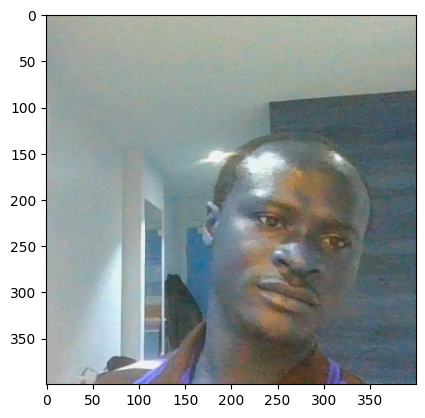

In [290]:
# visualizaing the sample image
sample_img = 'de6dbc19-28b4-11ee-b9a0-dca266030d3a.50.jpg'
sample_img = image.imread('aug_data/data/test/images/{}'.format(sample_img))
plt.imshow(sample_img)

In [241]:
# return back to pascal format
# list(np.multiply(alb_cord,  [640, 480 , 640, 480]))

In [291]:
# augmented_image = augmentor(image=sample_img, bboxes=[[0, 0, 0.00001, 0.00001]], class_labels=['face'])
augmented_image = augmentor(image=sample_img, bboxes=[alb_cord], class_labels=['face'])
augmented_image['bboxes']

[(0.0006898082386363638,
  0.9981516335227273,
  0.001377840909090909,
  0.9993057528409091)]

In [262]:
augmented_image.keys()

dict_keys(['image', 'bboxes', 'class_labels'])

In [263]:
# augmented_image

In [264]:
# augmented_image['image'].shape

In [80]:
# print(np.multiply(augmented_image['bboxes'][0][:2], [400,400]).astype(int))
# np.multiply(augmented_image['bboxes'][0][2:], [400,400]).astype(int)

In [238]:
# x1,y1,x2,y2 = augmented_image['bboxes'][0]
# np.multiply( list((x1,y1)), [400,400] ).astype(int)
# augmented_image['bboxes']

[341.5909090909091, 163.29545454545453]


(0.2583838383838384,
 0.3384343434343434,
 0.6497979797979797,
 0.8308585858585859)

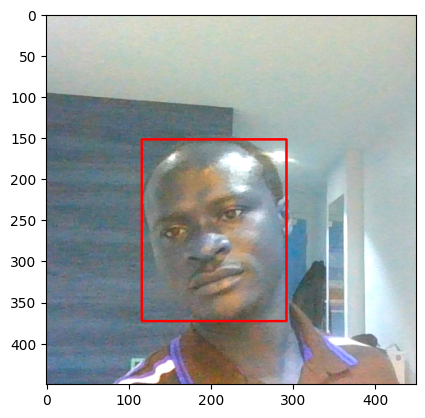

In [469]:
augmentor = alb.Compose([
                alb.RandomCrop(width=450, height=450), 
                alb.HorizontalFlip(p=0.5), 
                alb.RandomBrightnessContrast(p=0.2), 
                alb.RandomGamma(p=0.2), 
                alb.RGBShift(p=0.2), 
                alb.VerticalFlip(p=0.5)] ,
                bbox_params=alb.BboxParams(format='albumentations' , label_fields=['class_labels']) )
augmentor



with open('data/test/labels/de6dbc19-28b4-11ee-b9a0-dca266030d3a.json', 'r') as file: 
    label = json.load(file)
label

print(label['shapes'][0]['points'][0])

x1,y1 = label['shapes'][0]['points'][0]
x2,y2 = label['shapes'][0]['points'][1]

cord = [x1,y1,x2,y2]
alb_cord = list(np.divide(cord, [640,480,640,480]))



# visualizaing the sample image
sample_img = 'de6dbc19-28b4-11ee-b9a0-dca266030d3a.jpg'
sample_img = image.imread('data/test/images/{}'.format(sample_img))

augmented_image = augmentor(image=sample_img, bboxes=[alb_cord], class_labels=['face'])

cv2.rectangle(augmented_image['image'], 
              tuple( np.multiply(augmented_image['bboxes'][0][:2], [450,450] ).astype(int) ) , 
              tuple( np.multiply(augmented_image['bboxes'][0][2:] , [450,450] ).astype(int) ) , 
              # (int(x1), int(y1)) , (int(x2),int(y2)), 
              (255,0,0), 
              2)
plt.imshow(augmented_image['image'])
augmented_image['bboxes'][0]

pip line for generating Random No. of image per original Image

In [83]:
cord = np.divide([0, 0, 0.00001, 0.00001], [640, 480, 640, 480])
cord

array([0.00000000e+00, 0.00000000e+00, 1.56250000e-08, 2.08333333e-08])

In [149]:
import albumentations as alb
augmentor = alb.Compose([
                alb.RandomCrop(width=450, height=450), 
                alb.HorizontalFlip(p=0.5), 
                alb.RandomBrightnessContrast(p=0.2), 
                alb.RandomGamma(p=0.2), 
                alb.RGBShift(p=0.2), 
                alb.VerticalFlip(p=0.5)] ,
                bbox_params=alb.BboxParams(format='albumentations' , label_fields=['class_labels']) )
augmentor

Compose([
  RandomCrop(always_apply=False, p=1.0, height=400, width=400),
  HorizontalFlip(always_apply=False, p=0.5),
  RandomBrightnessContrast(always_apply=False, p=0.2, brightness_limit=(-0.2, 0.2), contrast_limit=(-0.2, 0.2), brightness_by_max=True),
  RandomGamma(always_apply=False, p=0.2, gamma_limit=(80, 120), eps=None),
  RGBShift(always_apply=False, p=0.2, r_shift_limit=(-20, 20), g_shift_limit=(-20, 20), b_shift_limit=(-20, 20)),
  VerticalFlip(always_apply=False, p=0.5),
], p=1.0, bbox_params={'format': 'albumentations', 'label_fields': ['class_labels'], 'min_area': 0.0, 'min_visibility': 0.0, 'min_width': 0.0, 'min_height': 0.0, 'check_each_transform': True}, keypoint_params=None, additional_targets={}, is_check_shapes=True)

In [470]:
# defining the albumentation
import albumentations as alb
augmentor = alb.Compose([
                alb.RandomCrop(width=450, height=450), 
                alb.HorizontalFlip(p=0.5), 
                alb.RandomBrightnessContrast(p=0.2), 
                alb.RandomGamma(p=0.2), 
                alb.RGBShift(p=0.2), 
                alb.VerticalFlip(p=0.5)] ,
                bbox_params=alb.BboxParams(format='albumentations' , label_fields=['class_labels']) )
augmentor






# helper method...1
def laod_json_helper(json_path): 
    with open(json_path) as file: 
       json_file = json.load(file)
    return json_file

# helper method two..
def load_cordinate_from_json_helper(json_file, albumentation_format=False):
    x1,y1 = json_file['shapes'][0]['points'][0]
    x2,y2 = json_file['shapes'][0]['points'][1]

    cord = [x1,y1,x2,y2]
    alb_cord = list(np.divide(cord, [640,480,640,480]))

    if albumentation_format: 
        return alb_cord
    else: 
        return cord


# helper method to create annotation
def create_anotation_helper(dict, image_url, bbox, cls): 
    
    dict['image'] =  image_url
    dict['bbox'] = bbox
    dict['class'] = cls

    return dict


def write_to_json_helper(path, annotation):
    with open(path, 'w') as j_file:
        json.dump(annotation, j_file)
        

# ====================================================


In [471]:
# image path 
train_path = 'data/train/images/'
test_path = 'data/test/images/'

# json path
train_folder = 'data/train/labels/'
test_folder = 'data/test/labels/'

# step 
temp_size = 5
folders = [train_path, test_path]
for path in folders:
    print('{} Image found in {}'.format(len(os.listdir(path)), path))
    # looping through the image url and loading actaal image 
    for img_url in os.listdir(path):
        # printing the image path
        print('{}'.format(path.split('/')[1]) )
        # raw image path
        image_path = '{}{}'.format(path , img_url)

        # setting default co_ordinate
        co_ord = [0, 0, 0.00001, 0.00001]
        # empty anotation holder  (having image, bbox and class as keys)
        annotation = {}
        # reading the actual image 
        img = cv2.imread(image_path)
        

        
        # checking if the image as equavalent json file 
        if (path.split('/')[1]) == 'train': 
            json_path =  '{}{}.json'.format(train_folder , img_url.split('.')[0])

        # else the test forlder == 'false'
        else:
            json_path =  '{}{}.json'.format(test_folder , img_url.split('.')[0])

        
        # checking if json file exist in the folder
        if os.path.exists(json_path): 
          
            # load json and copy content using the load_json_helper method... 
            json_file = laod_json_helper(json_path)
            
            # fetch co-ordinate from [json_file].....
            # passing the json file above
            co_ord = load_cordinate_from_json_helper(json_file, albumentation_format=True)
            
    
        # else if json file do not exist
        else:
            co_ord = [0, 0, 0.00001, 0.00001]
            # create a new json file with label 0, cor-dinate [0, 0, 0.00001, 0.00001]
            print('Path does not exist====================================')
            
    # =========================================================
    #              Data Augumentation Section 
    # ========================================================= 
        try: 
            for idx in range(60):
                
                # do data augumentation and save new content
                augmented_image = augmentor(image=img, bboxes=[co_ord], class_labels=['face'])
                default_bbox  = [0.0,0.0,0.0,0.0]
                json_image_url = '{}.{}.jpg'.format(img_url.split('.')[0], idx)
                # extract augment data values
                if len(augmented_image['bboxes']) != 0 : 
                    annotation = create_anotation_helper(annotation, json_image_url, augmented_image['bboxes'], 1) 
                else:
                    annotation = create_anotation_helper(annotation, json_image_url, default_bbox , 0) 
                    
                
                aug_root = 'aug_data/'
                
                # specify where to save image and label (train or test folder)
                if (path.split('/')[1]) == 'train':
                    
                    # image 
                    aug_img_path = '{}{}.{}.jpg'.format(aug_root, image_path.split('.')[0], idx)
                    print('PATH : {}{}'.format(aug_root, image_path))
                    cv2.imwrite(aug_img_path, augmented_image['image'])
        
                    # json
                    aug_json_path = '{}{}.{}.json'.format(aug_root, json_path.split('.')[0], idx)
                    print('PATH : {}{}'.format(aug_root, json_path))
                    write_to_json_helper(aug_json_path, annotation)
                    
                
                    # saving training section 
                else:
                    # saving testing section
                    # viewing paths for testing 
                    
                     # image 
                    aug_img_path = '{}{}.{}.jpg'.format(aug_root, image_path.split('.')[0], idx)
                    print('PATH : {}{}'.format(aug_root, image_path))
                    cv2.imwrite(aug_img_path, augmented_image['image'])
        
                    # json
                    aug_json_path = '{}{}.{}.json'.format(aug_root, json_path.split('.')[0], idx)
                    print('PATH : {}{}'.format(aug_root, json_path))
                    write_to_json_helper(aug_json_path, annotation)
                    
            
        except Exception as e: 
            print('error : ', e)
            
    print('Augumentation Operation Completed')  

81 Image found in data/train/images/
train
Path does not exist====================================
error :  image must be numpy array type
train
PATH : aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.jpg
PATH : aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.json
PATH : aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.jpg
PATH : aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.json
PATH : aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.jpg
PATH : aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.json
PATH : aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.jpg
PATH : aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.json
PATH : aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.jpg
PATH : aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.json
PATH : aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.jpg
PATH : aug_data/data/trai

......

LOADING BACK THE AUGMENTED DATA FOR TRAININ THE DEEP LEARNING MODEL

In [13]:
# TRAIN DATA X, and y
import pathlib
import json
url_path = 'aug_data/data/'
win_path = pathlib.Path(url_path)
win_path

WindowsPath('aug_data/data')

In [5]:
# train X, and y 
train_image = list(win_path.glob('train/images/*.jpg'), )
train_label = list(win_path.glob('train/labels/*.json'))
train_image[:20]

[WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.0.jpg'),
 WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.1.jpg'),
 WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.10.jpg'),
 WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.11.jpg'),
 WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.12.jpg'),
 WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.13.jpg'),
 WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.14.jpg'),
 WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.15.jpg'),
 WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.16.jpg'),
 WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.17.jpg'),
 WindowsPath('aug_data/data/train/images/d85c0a6c-28b4-11ee-ab45-dca266030d3a.18.jpg'),
 WindowsPath('aug_data/data/train/

In [6]:
train_label[:20]

[WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.0.json'),
 WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.1.json'),
 WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.10.json'),
 WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.11.json'),
 WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.12.json'),
 WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.13.json'),
 WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.14.json'),
 WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.15.json'),
 WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.16.json'),
 WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.17.json'),
 WindowsPath('aug_data/data/train/labels/d85c0a6c-28b4-11ee-ab45-dca266030d3a.18.json'),
 WindowsPath('aug_data/

In [7]:
print('X : {} , y : {}'.format(len(train_image), len(train_label)))

X : 4800 , y : 4800


In [8]:
import tensorflow as tf
tf.reduce_max

<function tensorflow.python.ops.math_ops.reduce_max(input_tensor, axis=None, keepdims=False, name=None)>

In [9]:
# test X, and y 
test_image = list(win_path.glob('test/images/*.jpg'))
test_label = list(win_path.glob('test/labels/*.json'))
test_label[:4]

[WindowsPath('aug_data/data/test/labels/daa1a826-28b4-11ee-af74-dca266030d3a.0.json'),
 WindowsPath('aug_data/data/test/labels/daa1a826-28b4-11ee-af74-dca266030d3a.1.json'),
 WindowsPath('aug_data/data/test/labels/daa1a826-28b4-11ee-af74-dca266030d3a.10.json'),
 WindowsPath('aug_data/data/test/labels/daa1a826-28b4-11ee-af74-dca266030d3a.11.json')]

In [10]:
print('X : {} , y : {}'.format(len(test_image), len(test_label)))

X : 1200 , y : 1200


In [14]:
with open('aug_data/data/test/labels/de6dbc19-28b4-11ee-b9a0-dca266030d3a.0.json', 'r') as file: 
    label = json.load(file)
label

{'image': 'de6dbc19-28b4-11ee-b9a0-dca266030d3a.0.jpg',
 'bbox': [[0.17393939393939384,
   0.3095454545454545,
   0.5653535353535353,
   0.801969696969697]],
 'class': 1}

In [15]:
import numpy as np
import json
import cv2
from matplotlib import pyplot as plt 
import random

In [179]:
# random.suffle()

In [16]:

# loadin actual data 
def load_image_helper(win_path):
    # empty list to hold the image
    X=[]
    for path in win_path: 
        img = cv2.imread(str(path))
        re_img = cv2.resize(img, (120,120))
        X.append(re_img)

    # returning a numpy version of the list
    return np.array(X)

# load json file by passing list of win directory
def load_json_helper(win_path):
    y = []
    for json_path in win_path:
        with open(str(json_path)) as file: 
           json_file = json.load(file)
           y.append(json_file)
    
    return np.array(y)


# train set
X_train = load_image_helper(train_image)
y_train = load_json_helper(train_label)

# test set
X_test = load_image_helper(test_image)
y_test = load_json_helper(test_label)

In [18]:
train_image[223]
# 'd85c0a6c-28b4-11ee-ab45-dca266030d3a.0' == "d85c0a6c-28b4-11ee-ab45-dca266030d3a.0"

WindowsPath('aug_data/data/train/images/d9b3bebf-28b4-11ee-8451-dca266030d3a.48.jpg')

In [19]:
# y train require futher preprocessing
y_train[223]

{'image': 'd9b3bebf-28b4-11ee-8451-dca266030d3a.48.jpg',
 'bbox': [[0.45797979797979804,
   0.23994949494949502,
   0.8645454545454545,
   0.7399494949494949]],
 'class': 1}

In [20]:
y_train[0]['bbox']

[[0.13171717171717168,
  0.24277777777777781,
  0.5887878787878787,
  0.7629797979797981]]

In [21]:
y_train[0]['bbox'][0]

[0.13171717171717168,
 0.24277777777777781,
 0.5887878787878787,
 0.7629797979797981]

In [17]:
## getting the bounding box and the class of 0 or 1 in a single turple variable
def extract_bbox_and_class_helper(json_file): 
    class_data = [] 
    bbox_data = []
    for idx in range(len(json_file)): 
        class_data.append([json_file[idx]['class']])
        if json_file[idx]['bbox'][0] == 0: 
            bbox_data.append([0,0,0,0])
        else:
            bbox_data.append(json_file[idx]['bbox'][0])
        
    return np.array(class_data, np.int8) , np.array(bbox_data, np.float16) 


ytrain = extract_bbox_and_class_helper(y_train)
ytest = extract_bbox_and_class_helper(y_test)

In [23]:
ytrain[1][1][:2]

array([0.274 , 0.2583], dtype=float16)

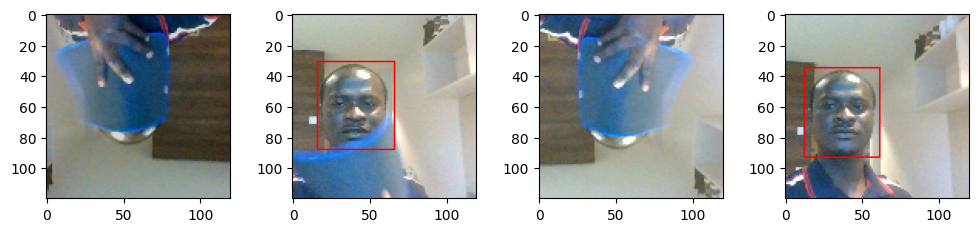

In [19]:
def show_bounding_box(samp_img, bbox, cls , plt): 

    if int(cls) != 0 : 
        cv2.rectangle(samp_img, 
                  tuple( np.multiply( bbox[:2] , [120,120] ).astype(int) ) , 
                  tuple( np.multiply( bbox[2:], [120,120] ).astype(int) ) , 
                  # (int(x1), int(y1)) , (int(x2),int(y2)), 
                  (255,0,0), 1)
        
        plt.imshow(samp_img)
    else: 
        plt.imshow(samp_img)

fix , ax = plt.subplots(ncols=4, figsize=(10,8))
plt.tight_layout()

for idx in range(4):
    rand = random.randint(0,500)
    show_bounding_box(X_train[rand], ytrain[1][rand] , ytrain[0][rand], ax[idx] )

In [20]:
# scalling xtrain and ytrain image to improve image prediction
X_train = X_train/255
X_test = X_test/255

In [45]:
X_train[0]

array([[[0.57647059, 0.60784314, 0.60784314],
        [0.57647059, 0.61176471, 0.6       ],
        [0.55686275, 0.60392157, 0.58039216],
        ...,
        [0.65882353, 0.60784314, 0.54509804],
        [0.65882353, 0.61176471, 0.56470588],
        [0.65490196, 0.6       , 0.56078431]],

       [[0.58431373, 0.6       , 0.59215686],
        [0.58039216, 0.60784314, 0.58823529],
        [0.57254902, 0.61176471, 0.58823529],
        ...,
        [0.65490196, 0.60392157, 0.54117647],
        [0.65490196, 0.60392157, 0.54901961],
        [0.65490196, 0.60784314, 0.55294118]],

       [[0.58431373, 0.6       , 0.58039216],
        [0.58431373, 0.61176471, 0.58431373],
        [0.58039216, 0.61176471, 0.58431373],
        ...,
        [0.65098039, 0.59607843, 0.53333333],
        [0.63921569, 0.59215686, 0.52156863],
        [0.6627451 , 0.6       , 0.52941176]],

       ...,

       [[0.0627451 , 0.17254902, 0.29803922],
        [0.04705882, 0.15686275, 0.26666667],
        [0.0627451 , 0

In [21]:
X_train.shape

(4800, 120, 120, 3)

In [26]:
ytrain[0].shape

(4800, 1)

Buiding Classification Model 

In [96]:
from sklearn import model_selection
import tensorflow 
import tensorflow as tf 
from tensorflow import keras
from tensorflow.keras.applications import vgg16
import keras

In [97]:
vgg_model = vgg16.VGG16(include_top=False)
vgg_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [107]:
# face detection model .. 

# input layer
input_layer = keras.layers.Input(shape=(120,120,3) )

# vgg16 layer
vgg_layer = vgg_model(input_layer)

# classification head (0, 1) prediction 
pool_1 = keras.layers.GlobalAveragePooling2D()(vgg_layer)
dense_1 = keras.layers.Dense(1024, activation='relu')(pool_1)
clss_head = keras.layers.Dense(1, activation='sigmoid', name='class_head')(dense_1)

# regression head bounding box prediction 
pool_2 = keras.layers.GlobalAveragePooling2D()(vgg_layer)
dense_2 = keras.layers.Dense(1024, activation='relu')(pool_2)
reg_head = keras.layers.Dense(4, activation='sigmoid', name='regress_head')(dense_2)

# model
face_model = keras.Model(inputs=input_layer, outputs=[clss_head, reg_head])

In [108]:

def localization_loss(y_true, yhat):
    delta = tf.reduce_sum(tf.square(y_true[:, :2] - yhat[:, :2]))

    h_true = y_true[:, 3] - y_true[:, 1]
    w_true = y_true[:, 2] - y_true[:, 0]

    h_pred = yhat[:, 3] - yhat[:, 1]
    w_pred = yhat[:, 2] - yhat[:, 0]

    delta_size = tf.reduce_sum(tf.square(w_true- w_pred) + tf.square(h_true-h_pred))

    return delta + delta_size
# localization_loss = 

In [109]:
# specify losses for face detection and bbox 
binary_loss = keras.metrics.BinaryCrossentropy(from_logits=True) 
multiclass_loss = keras.metrics.CategoricalCrossentropy(from_logits=True)  
opt = keras.optimizers.Adam(learning_rate=0.0001)

face_model.compile(
    # optimizer='Adam'
    optimizer= opt, 
    loss=['binary_crossentropy', multiclass_loss],
    # loss= [binary_loss, multiclass_loss], 
    metrics=['accuracy']
)

face_model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 120, 120, 3)]        0         []                            
                                                                                                  
 vgg16 (Functional)          (None, None, None, 512)      1471468   ['input_6[0][0]']             
                                                          8                                       
                                                                                                  
 global_average_pooling2d_8  (None, 512)                  0         ['vgg16[4][0]']               
  (GlobalAveragePooling2D)                                                                        
                                                                                            

In [110]:
samples =  X_train[:3]
face_model.predict(samples)

# X_train[0]

1/1 [==============================] - 0s 270ms/step


[array([[1.       ],
        [0.8529794],
        [0.8713591]], dtype=float32),
 array([[1.2036112e-05, 8.7719929e-01, 1.0000000e+00, 4.0036136e-07],
        [6.2193203e-01, 9.0441734e-01, 8.3796942e-01, 2.2094916e-01],
        [6.2781405e-01, 9.2403555e-01, 8.5030627e-01, 1.6357750e-01]],
       dtype=float32)]

In [47]:
ytrain[1]

array([[0.1317 , 0.2428 , 0.589  , 0.763  ],
       [0.274  , 0.2583 , 0.731  , 0.7783 ],
       [0.09393, 0.254  , 0.551  , 0.774  ],
       ...,
       [0.4412 , 0.3    , 0.7974 , 0.795  ],
       [0.2522 , 0.2094 , 0.6084 , 0.704  ],
       [0.2673 , 0.1782 , 0.6235 , 0.6733 ]], dtype=float16)

In [111]:
train_history = face_model.fit(X_train, [ytrain[0], ytrain[1]],  epochs=5)

Epoch 1/5
107/150 [====================>.........] - ETA: 3:52 - loss: 5.0567 - class_head_loss: 0.1374 - regress_head_loss: 4.9192 - class_head_accuracy: 0.9533 - regress_head_accuracy: 0.4939 - categorical_crossentropy: 6.1475

KeyboardInterrupt: 

In [53]:
face_model.save('model/face_detection_and_localization_model.h5')

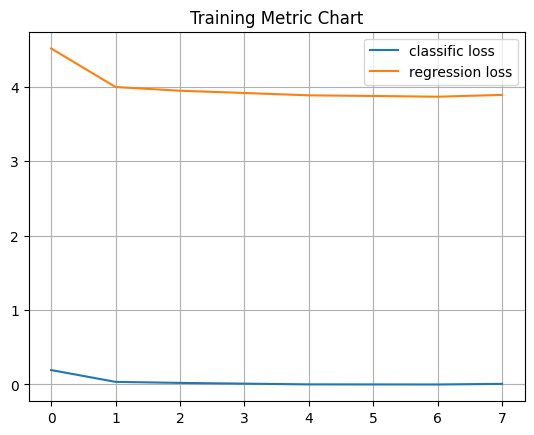

In [49]:
class_loss = train_history.history['classification_head_loss']
reg_loss = train_history.history['regression_head_loss']
cls_acc = train_history.history['classification_head_accuracy']
reg_acc = train_history.history['regression_head_accuracy']


plt.title('Training Metric Chart')
plt.plot(class_loss, label='classific loss')
plt.plot(reg_loss, label='regression loss')
plt.grid()
plt.legend()
plt.show()

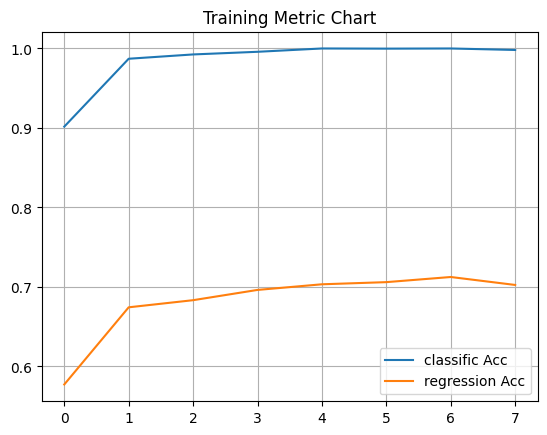

In [50]:
plt.title('Training Metric Chart')
plt.plot(cls_acc, label='classific Acc')
plt.plot(reg_acc, label='regression Acc')
plt.grid()
plt.legend()
plt.show()

In [22]:
import keras
from keras.models import load_model

def localization_loss(y_true, yhat):
    delta = tf.reduce_sum(tf.square(y_true[:, :2] - yhat[:, :2]))

    h_true = y_true[:, 3] - y_true[:, 1]
    w_true = y_true[:, 2] - y_true[:, 0]

    h_pred = yhat[:, 3] - yhat[:, 1]
    w_pred = yhat[:, 2] - yhat[:, 0]

    delta_size = tf.reduce_sum(tf.square(w_true- w_pred) + tf.square(h_true-h_pred))

    return delta + delta_size
opt = keras.optimizers.Adam(learning_rate=0.0001)


face_detect_model = load_model("model/face_detection_and_localization_model.h5", compile=False)
face_detect_model.compile(  
    # optimizer='Adam', 
    optimizer = opt,
    loss=['binary_crossentropy' , localization_loss], 
    metrics=['accuracy']
)

In [2]:
face_detect_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 120, 120, 3)]        0         []                            
                                                                                                  
 vgg16 (Functional)          (None, None, None, 512)      1471468   ['input_3[0][0]']             
                                                          8                                       
                                                                                                  
 global_average_pooling2d (  (None, 512)                  0         ['vgg16[0][0]']               
 GlobalAveragePooling2D)                                                                          
                                                                                              

In [23]:
eval_history = face_detect_model.evaluate(X_test, ytest)
eval_history

38/38 [==============================] - 44s 1s/step - loss: 3.9728 - classification_head_loss: 0.0511 - regression_head_loss: 3.9217 - classification_head_accuracy: 0.9808 - regression_head_accuracy: 0.5850


[3.972799777984619,
 0.05113490670919418,
 3.9216654300689697,
 0.9808333516120911,
 0.5849999785423279]

In [69]:
# X_test[190]

In [85]:
face_detect = face_detect_model.predict(np.array([X_test[190]]))
face_detect

1/1 [==============================] - 0s 67ms/step


[array([[0.01680061]], dtype=float32),
 array([[1.4797436e-01, 6.5657285e-11, 1.2368978e-02, 8.3965671e-01]],
       dtype=float32)]

In [71]:
samp_img = X_test[190]
# bbox = face_detect[1][0]
# bbox[:2]
# face_detect[1].tolist()[0][:2]

array([3.389197e-02, 4.974824e-09], dtype=float32)

In [90]:
np.array((X_train[10],)).shape

(1, 120, 120, 3)

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 62ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 70ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


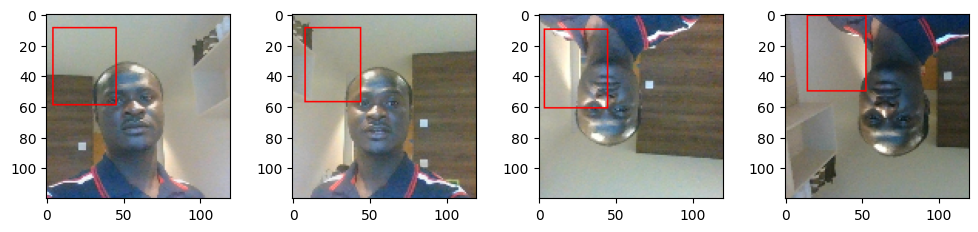

In [93]:
def show_bounding_box(model, samp_img, plt): 
    img = samp_img
    predict = model.predict(np.array((img,)))
    cls = predict[0][0]
    bbox = predict[1][0]
    if cls > 0.5 : 
        cv2.rectangle(samp_img, 
                  tuple( np.multiply( bbox[:2] , [120,120] ).astype(int) ) , 
                  tuple( np.multiply( bbox[2:], [120,120] ).astype(int) ) , 
                  # (int(x1), int(y1)) , (int(x2),int(y2)), 
                  (255,0,0), 1)
        
        plt.imshow(samp_img)
    else: 
        plt.imshow(samp_img)

fix , ax = plt.subplots(ncols=4, figsize=(10,8))
plt.tight_layout()

for idx in range(4):
    rand = random.randint(0,500)
    show_bounding_box(face_detect_model, X_train[rand], ax[idx] )

1/1 [==============================] - 0s 61ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 65ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 60ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 66ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


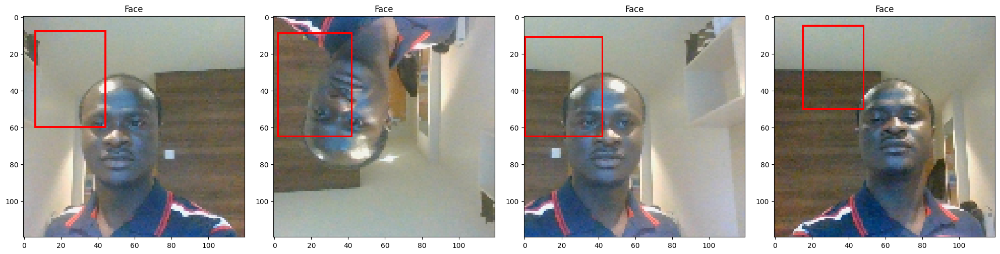

In [94]:
def show_bounding_box(samp_img, x1,y1,x2,y2, plt): 
    cv2.rectangle(samp_img, 
              tuple( np.multiply( list((x1,y1)), [120,120] ).astype(int) ) , 
              tuple( np.multiply( list((x2,y2)), [120,120] ).astype(int) ) , 
              # (int(x1), int(y1)) , (int(x2),int(y2)), 
              (255,0,0), 1)
    
    plt.imshow(samp_img)
    

def face_localization_prediction(model, image, plt):
    # make prediction
    face_detect = model.predict(np.array([image]))
    # extract co-ordinate
    x1,y1,x2,y2 = face_detect[1].tolist()[0]
    # show prediction
    face_prob = face_detect[0].tolist()[0][0]
    # isFace = False
    # face_label = "Face"

    if face_prob > 0.5: 
        # isFace = True
        show_bounding_box(image, x1,y1,x2,y2, plt)
        plt.set_title("Face")
    
    else: 
        plt.set_title("No Face")
        plt.imshow(image)
    #     isFace = False

fig , ax = plt.subplots(ncols=4, figsize=(20,20))
plt.tight_layout()


for idx in range(4): 
    face_localization_prediction(face_detect_model, X_test[random.randint(0,500)], ax[idx])
    

In [2]:
import cv2

In [7]:
classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

cap = cv2.VideoCapture(0)

while(True): 
    rec, frame = cap.read()

    img = cv2.cvtColor(frame, cv2.COLOR_BAYER_BG2RGB)
    face = classifier.detectMultiScale(img, 1.3,5)

    for x,y,w,h in faces: 
        face_image = img[y:y+w, x:x+w]
        reshape = cv2.resize(face_image, (100,100))
        scale = reshape/255.0
        reshaped = np.reshape(scale, (1,100,100,1))

        cv2.rectangle(img, (x, y), (x+w, y+h), (255,0,0) , 1)
        cv2.rectangle(img, (x, y-40), (x+w, y), (255,255,0) , -1)
        
    cv2.imshow('imag', img)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyWindow()

error: OpenCV(4.8.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\demosaicing.cpp:1721: error: (-215:Assertion failed) scn == 1 && (dcn == 3 || dcn == 4) in function 'cv::demosaicing'
